In [3]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add, Concatenate, BatchNormalization, TimeDistributed
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
import pickle
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
import string
import re

# Kaggle dataset paths
BASE_DIR = '../input/deeplearning/'
IMAGES_DIR = os.path.join(BASE_DIR, 'Images/Images/')
CAPTIONS_PATH = os.path.join(BASE_DIR, 'captions.txt')

# Create output directories for models and data
os.makedirs('model', exist_ok=True)
os.makedirs('data', exist_ok=True)

# Load captions
print("Loading captions...")
with open(CAPTIONS_PATH, "r") as f:
    captions_data = f.readlines()

# Process captions
def clean_caption(caption):
    # Convert to lowercase
    caption = caption.lower()
    # Remove punctuation
    caption = caption.translate(str.maketrans('', '', string.punctuation))
    # Remove extra spaces
    caption = re.sub(' +', ' ', caption).strip()
    # Add start and end tokens
    caption = '<start> ' + caption + ' <end>'
    return caption

cleaned_captions = []
image_names = []

for line in captions_data:
    line = line.strip()
    if line:  # Skip empty lines
        parts = line.split(',', 1)  # Split only at the first comma
        if len(parts) >= 2:
            image_name = parts[0].strip()
            caption = parts[1].strip()
            
            # Clean caption
            caption = clean_caption(caption)
            
            image_names.append(image_name)
            cleaned_captions.append(caption)

print(f"Loaded {len(cleaned_captions)} captions")
print(f"Sample caption: {cleaned_captions[0]}")
print(f"Sample image name: {image_names[0]}")

# Configure parameters
vocab_size = 10000  # Increased vocabulary size
max_length = 40    # Increased max caption length
embedding_dim = 512  # Increased embedding dimension
units = 512  # Increased LSTM units
batch_size = 32
features_shape = 2048  # InceptionV3 output shape
dropout_rate = 0.4

# Function to extract features from images using InceptionV3
def extract_features():
    # Load InceptionV3 model
    base_model = InceptionV3(weights='imagenet', include_top=False, pooling='avg')
    
    features = {}
    # Get list of all image files
    image_files = [f for f in os.listdir(IMAGES_DIR) if f.endswith('.jpg')]
    
    print(f"Extracting features from {len(image_files)} images...")
    
    # Process images in batches to avoid memory issues
    for img_name in tqdm(image_files):
        img_path = os.path.join(IMAGES_DIR, img_name)
        try:
            img = Image.open(img_path)
            img = img.resize((299, 299))  # InceptionV3 input size
            img = np.array(img)
            
            # Handle grayscale images
            if len(img.shape) == 2:
                img = np.stack((img,)*3, axis=-1)
            elif img.shape[2] == 1:
                img = np.concatenate([img, img, img], axis=2)
            elif img.shape[2] == 4:  # Handle RGBA
                img = img[:,:,:3]
                
            # Preprocess for InceptionV3
            img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
            img = tf.keras.applications.inception_v3.preprocess_input(img)
            
            # Extract features
            feature = base_model.predict(img, verbose=0)
            features[img_name] = feature.flatten()
        except Exception as e:
            print(f"Error processing {img_name}: {e}")
    
    return features

# Extract features from all images
print("Extracting features from images...")
image_features = extract_features()
print(f"Features extracted for {len(image_features)} images")

# Save the features
with open('data/image_features.pkl', 'wb') as f:
    pickle.dump(image_features, f)

# Create a vocabulary from captions
print("Tokenizing captions...")
tokenizer = Tokenizer(num_words=vocab_size, oov_token='<unk>')
tokenizer.fit_on_texts(cleaned_captions)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

# Save the tokenizer
with open('data/tokenizer.pkl', 'wb') as f:
    pickle.dump(tokenizer, f)

# Create sequences
captions_sequences = tokenizer.texts_to_sequences(cleaned_captions)
captions_padded = pad_sequences(captions_sequences, maxlen=max_length, padding='post')

# Prepare training data
X_data = []  # Features
y_data = []  # Target captions

for i, img_name in enumerate(image_names):
    if img_name in image_features:
        X_data.append(image_features[img_name])
        y_data.append(captions_padded[i])

X_data = np.array(X_data)
y_data = np.array(y_data)

print(f"Training data shape: {X_data.shape}")
print(f"Target data shape: {y_data.shape}")

# Split dataset with larger validation set for better evaluation
X_train, X_val, y_train, y_val = train_test_split(X_data, y_data, test_size=0.15, random_state=42)

# Build improved attention-based model
def build_model(vocab_size, max_length, features_shape, embedding_dim=512, dropout=0.4, lstm_units=512):
    # Image feature input
    image_input = Input(shape=(features_shape,))
    img_dense1 = Dense(embedding_dim, activation="relu")(image_input)
    img_bn = BatchNormalization()(img_dense1)
    img_dropout = Dropout(0.3)(img_bn)
    
    # Need to repeat the image features for each word in the sequence
    img_repeat = tf.keras.layers.RepeatVector(max_length)(img_dropout)
    
    # Text sequence input
    text_input = Input(shape=(max_length,))
    text_embed = Embedding(vocab_size, embedding_dim, mask_zero=False)(text_input)
    text_dropout1 = Dropout(0.2)(text_embed)
    
    # Combine image and text features
    merged = add([img_repeat, text_dropout1])
    
    # LSTM layer
    lstm1 = LSTM(lstm_units, return_sequences=True, recurrent_dropout=0.2)(merged)
    
    # Use TimeDistributed to apply Dense layer for each time step
    # This is the key fix - we need to output a prediction for each time step
    td = TimeDistributed(Dense(vocab_size, activation='softmax'))(lstm1)
    
    model = Model(inputs=[image_input, text_input], outputs=td)
    
    # Learning rate scheduler
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
    
    # Use sparse categorical crossentropy for integer targets
    model.compile(
        loss='sparse_categorical_crossentropy', 
        optimizer=optimizer,
        metrics=['accuracy']
    )
    
    return model

def train_model(X_train, y_train, X_val, y_val, vocab_size, max_length, batch_size):
    """Train the model with enhanced training process"""
    os.makedirs("model", exist_ok=True)
    
    # Prepare target sequences - shift by one for teacher forcing
    # Use 3D tensor shape for sparse categorical crossentropy
    train_targets = np.zeros((y_train.shape[0], y_train.shape[1], 1), dtype=np.int32)
    for i in range(y_train.shape[0]):
        train_targets[i, :-1, 0] = y_train[i, 1:]
        
    val_targets = np.zeros((y_val.shape[0], y_val.shape[1], 1), dtype=np.int32)
    for i in range(y_val.shape[0]):
        val_targets[i, :-1, 0] = y_val[i, 1:]
    
    print("Building and training the model...")
    
    model = build_model(
        vocab_size=vocab_size,
        max_length=max_length,
        features_shape=X_train.shape[1],
        embedding_dim=embedding_dim,
        dropout=dropout_rate,
        lstm_units=units
    )
    
    model.summary()
    
    callbacks = [
        ModelCheckpoint(
            "model/best_caption_generator.keras",
            monitor='val_loss',
            save_best_only=True,
            mode='min'
        ),
        EarlyStopping(
            monitor='val_loss',
            patience=5,
            restore_best_weights=True
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=2,
            min_lr=1e-6
        )
    ]
    
    # Print shapes for debugging
    print(f"Input shapes - X: {X_train.shape}, y: {y_train.shape}, targets: {train_targets.shape}")
    
    try:
        history = model.fit(
            [X_train, y_train],
            train_targets,
            validation_data=(
                [X_val, y_val],
                val_targets
            ),
            epochs=20,  # Increased epochs with early stopping
            batch_size=batch_size,
            callbacks=callbacks
        )
        
        # Plot training history
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title('Loss')
        plt.xlabel('Epoch')
        plt.legend()
        
        plt.subplot(1, 2, 2)
        plt.plot(history.history['accuracy'], label='Training Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.title('Accuracy')
        plt.xlabel('Epoch')
        plt.legend()
        
        plt.tight_layout()
        plt.savefig('model/training_history.png')
        plt.close()
        
        print("Training complete. Best model saved.")
        
    except Exception as e:
        print(f"Error during training: {e}")
        print(f"X_train dtype: {X_train.dtype}")
        print(f"y_train dtype: {y_train.dtype}")
        print(f"train_targets dtype: {train_targets.dtype}")
    
    return model

# Call the training function
model = train_model(X_train, y_train, X_val, y_val, vocab_size, max_length, batch_size)

# Save final model
model.save('model/final_caption_generator.keras')
print("Model saved successfully!")

Loading captions...
Loaded 40456 captions
Sample caption: <start> caption <end>
Sample image name: image
Extracting features from images...
Extracting features from 8090 images...


100%|██████████| 8090/8090 [10:38<00:00, 12.66it/s]


Features extracted for 8090 images
Tokenizing captions...
Training data shape: (40450, 2048)
Target data shape: (40450, 40)
Building and training the model...


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 2048)           │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 512)            │      1,049,088 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_283   │ (None, 512)            │          2,048 │ dense_7[0][0]          │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_6             │ (None, 40)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 512)            │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding_1 (Embedding)   │ (None, 40, 512)        │      5,120,000 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ repeat_vector             │ (None, 40, 512)        │              0 │ dropout_3[0][0]        │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 40, 512)        │              0 │ embedding_1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 40, 512)        │              0 │ repeat_vector[0][0],   │
│                           │                        │                │ dropout_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 40, 512)        │      2,099,200 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ time_distributed          │ (None, 40, 10000)      │      5,130,000 │ lstm_1[0][0]           │
│ (TimeDistributed)         │                        │                │                        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 13,400,336 (51.12 MB)

 Trainable params: 13,399,312 (51.11 MB)

 Non-trainable params: 1,024 (4.00 KB)

Input shapes - X: (34382, 2048), y: (34382, 40), targets: (34382, 40, 1)
Epoch 1/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 103s 86ms/step - accuracy: 0.7328 - loss: 1.9852 - val_accuracy: 0.8089 - val_loss: 1.0145 - learning_rate: 0.0010
Epoch 2/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 93s 86ms/step - accuracy: 0.8120 - loss: 0.9578 - val_accuracy: 0.8183 - val_loss: 0.9111 - learning_rate: 0.0010
Epoch 3/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 93s 86ms/step - accuracy: 0.8232 - loss: 0.8338 - val_accuracy: 0.8249 - val_loss: 0.8626 - learning_rate: 0.0010
Epoch 4/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 93s 86ms/step - accuracy: 0.8316 - loss: 0.7559 - val_accuracy: 0.8282 - val_loss: 0.8359 - learning_rate: 0.0010
Epoch 5/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 93s 86ms/step - accuracy: 0.8369 - loss: 0.7016 - val_accuracy: 0.8309 - val_loss: 0.8219 - learning_rate: 0.0010
Epoch 6/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 92s 86ms/step - accuracy: 0.8421 - loss: 0.6590 - val_accuracy: 0.8316 - val_loss: 0.8161 - learning_rat

Test images directory created at: /kaggle/working/test_images
Loading tokenizer...
Added missing token '<start>' to tokenizer
Added missing token '<end>' to tokenizer
Loading model...
Model loaded successfully!
Loading feature extraction model...
Testing caption generator...

Using beam search:
Generating captions for 5 images with beam search...
Image: 783994497_4f6885454d.jpg
Caption: Beer end.
Generation time: 16.73 seconds
--------------------------------------------------


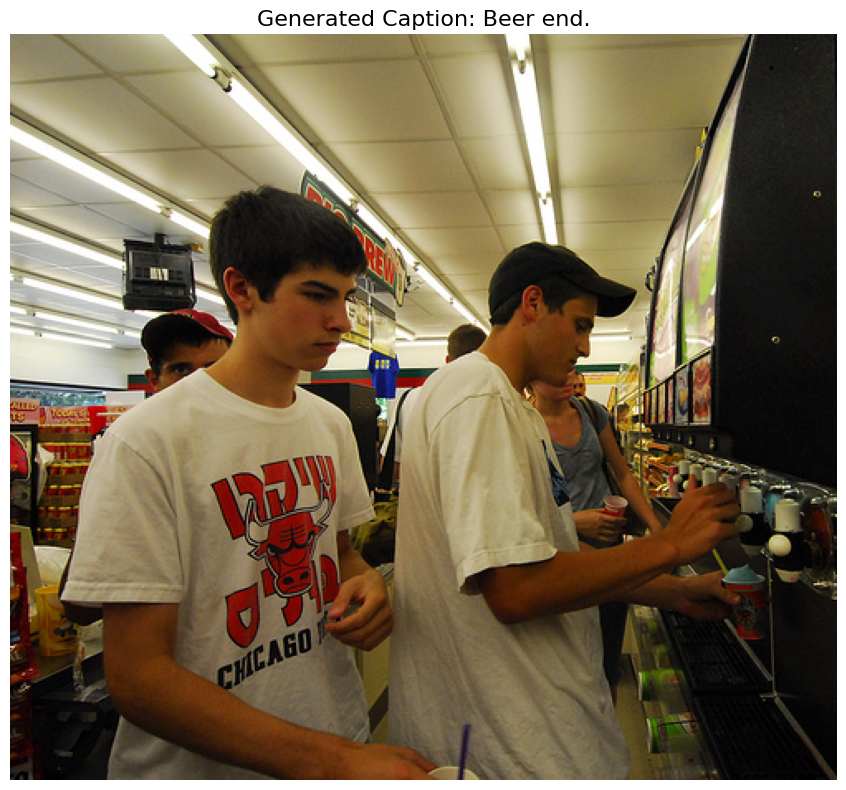

Image: 805682444_90ed9e1ef3.jpg
Caption: White and black and white dog end.
Generation time: 9.55 seconds
--------------------------------------------------


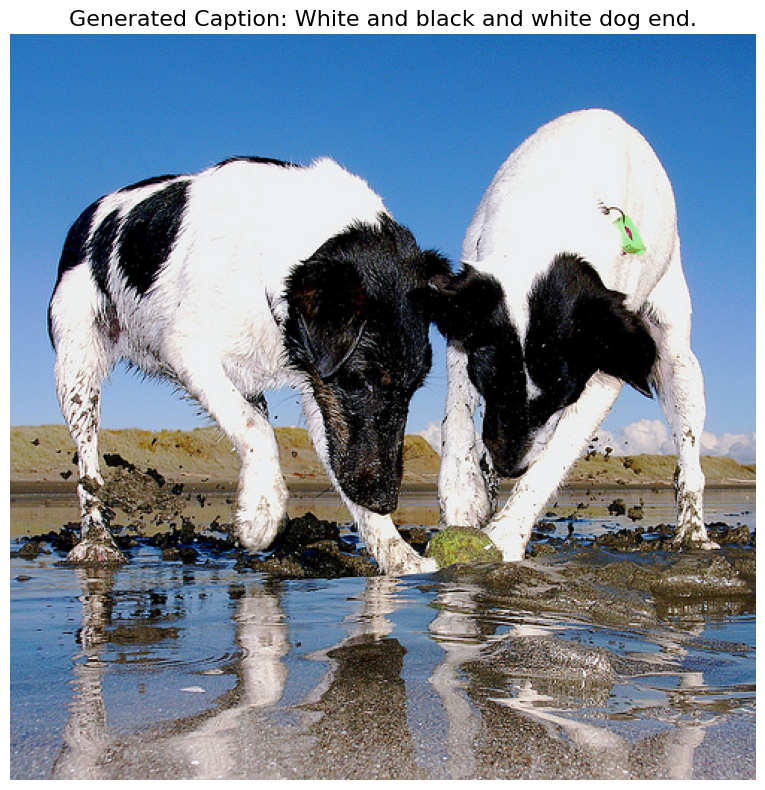

Image: _128340524_gettyimages-1390328477.jpg
Caption: Bird duck beak flapping its beak flapping beak end.
Generation time: 9.69 seconds
--------------------------------------------------


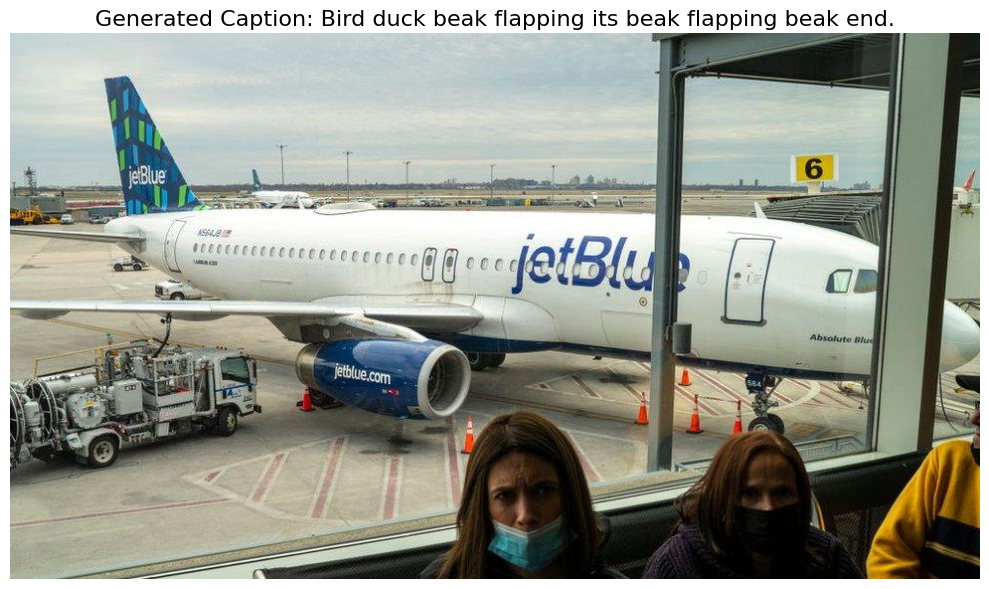

Image: 820169182_f5e78d7d19.jpg
Caption: Other children play in a ball pit end.
Generation time: 9.52 seconds
--------------------------------------------------


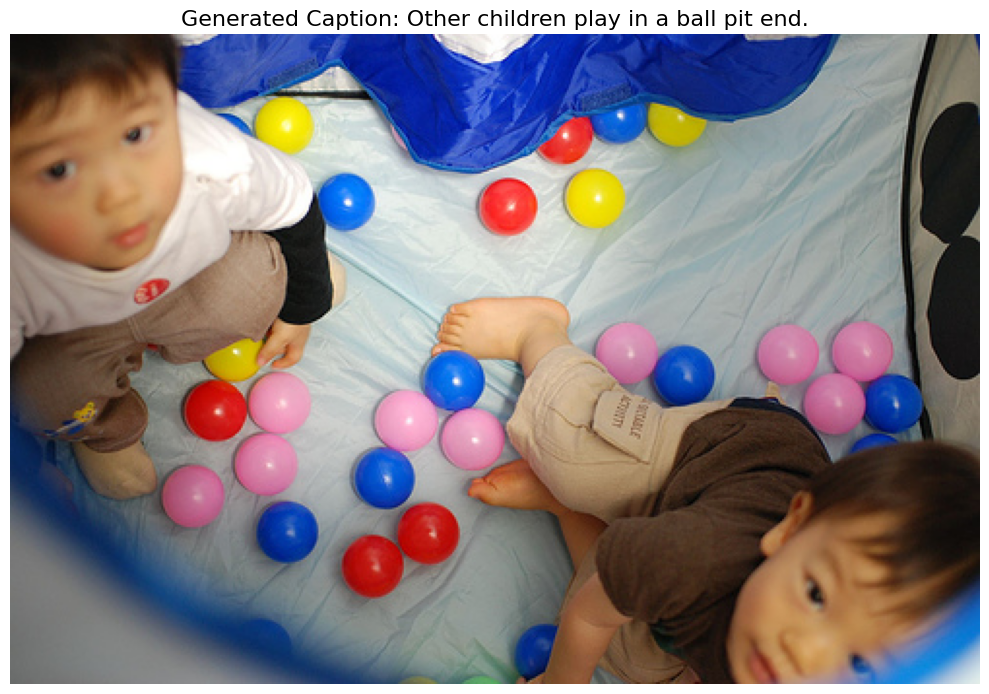

Image: 811663364_4b350a62ce.jpg
Caption: Wet blond girl in pink bathing suit jumping in the air end.
Generation time: 9.63 seconds
--------------------------------------------------


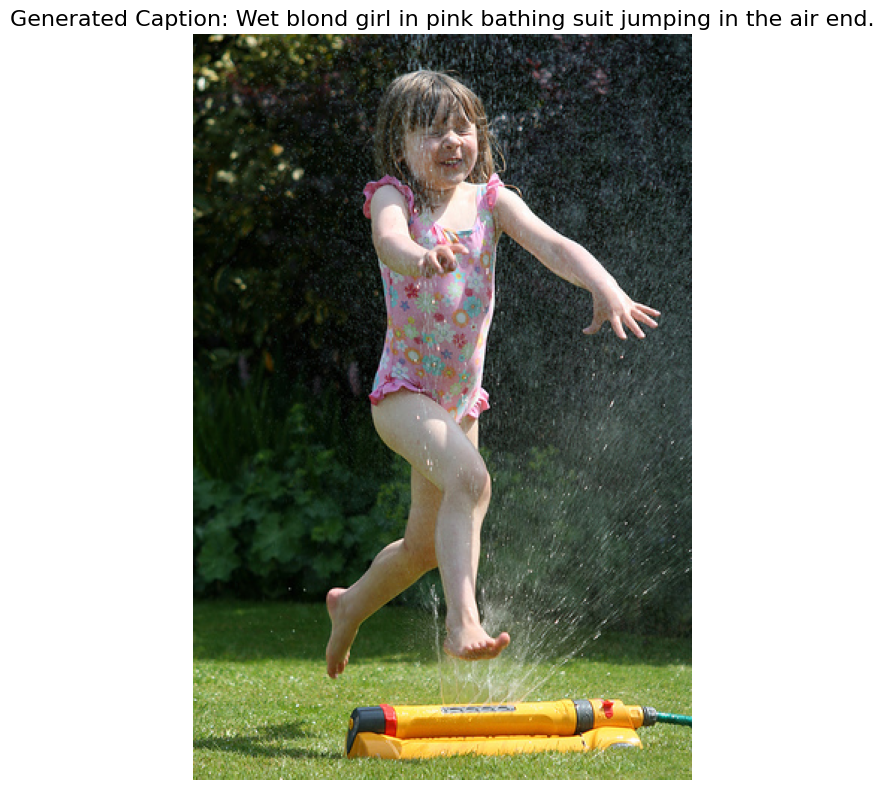


Using greedy search:
Generating captions for 5 images with greedy search...
Image: 783994497_4f6885454d.jpg
Caption: Drinks from a beer end.
Generation time: 3.24 seconds
--------------------------------------------------


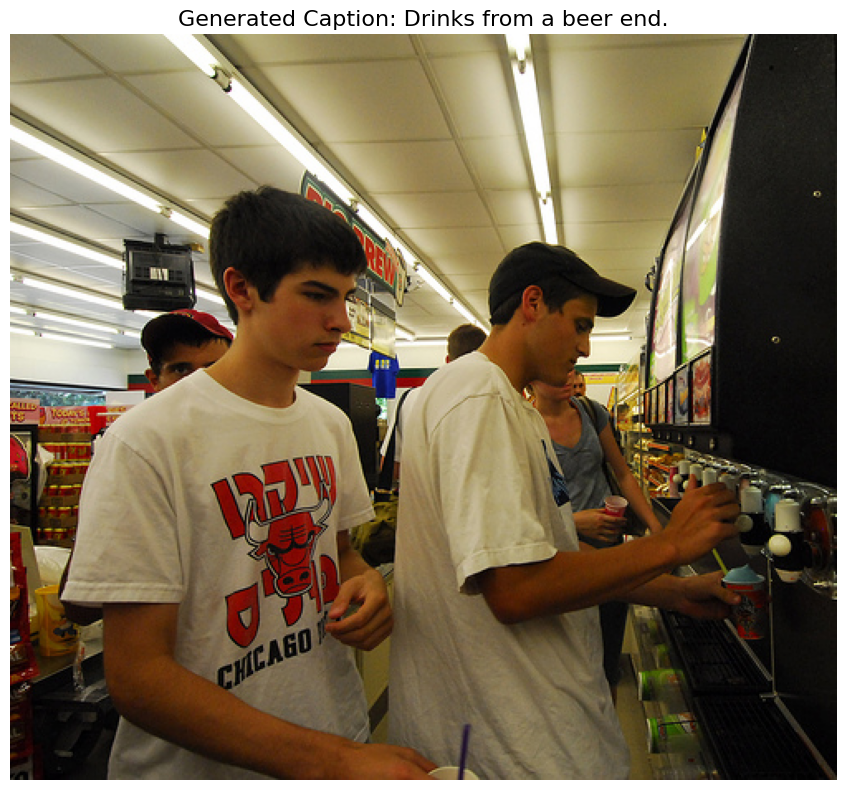

Image: 805682444_90ed9e1ef3.jpg
Caption: White and black and white dog end.
Generation time: 3.25 seconds
--------------------------------------------------


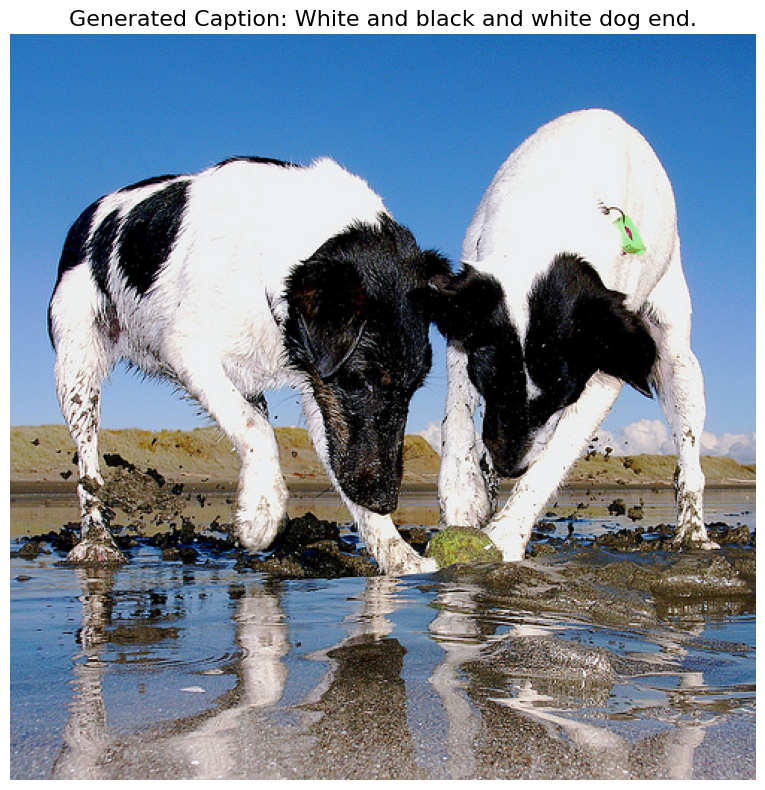

Image: _128340524_gettyimages-1390328477.jpg
Caption: Bird duck beak swiftly water end.
Generation time: 3.23 seconds
--------------------------------------------------


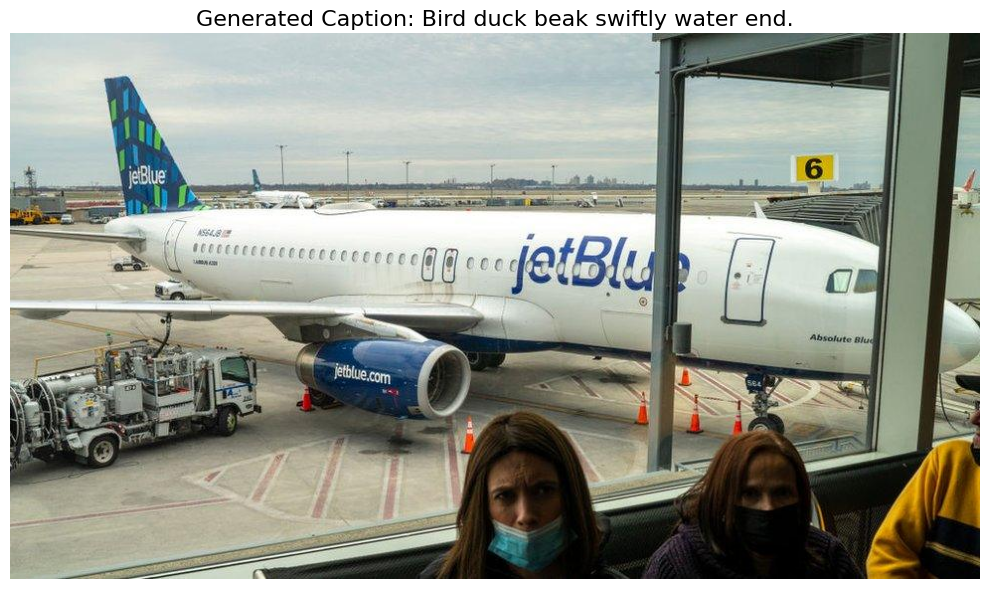

Image: 820169182_f5e78d7d19.jpg
Caption: Two babies are playing in a ball pit end.
Generation time: 3.25 seconds
--------------------------------------------------


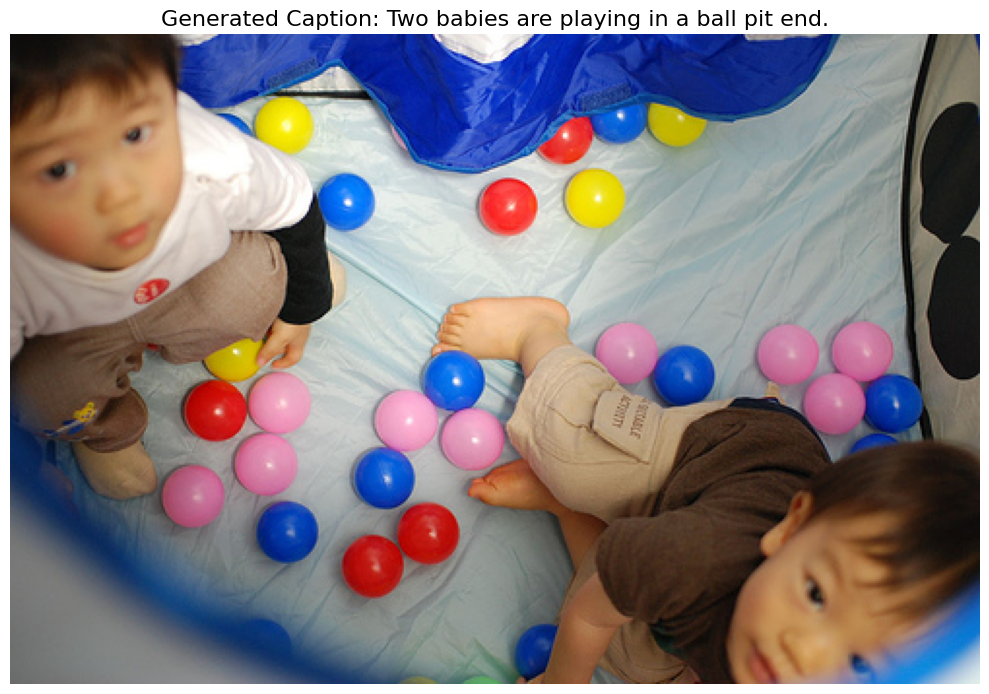

Image: 811663364_4b350a62ce.jpg
Caption: Wet blond girl in pink bathing suit jumping in the air end.
Generation time: 3.28 seconds
--------------------------------------------------


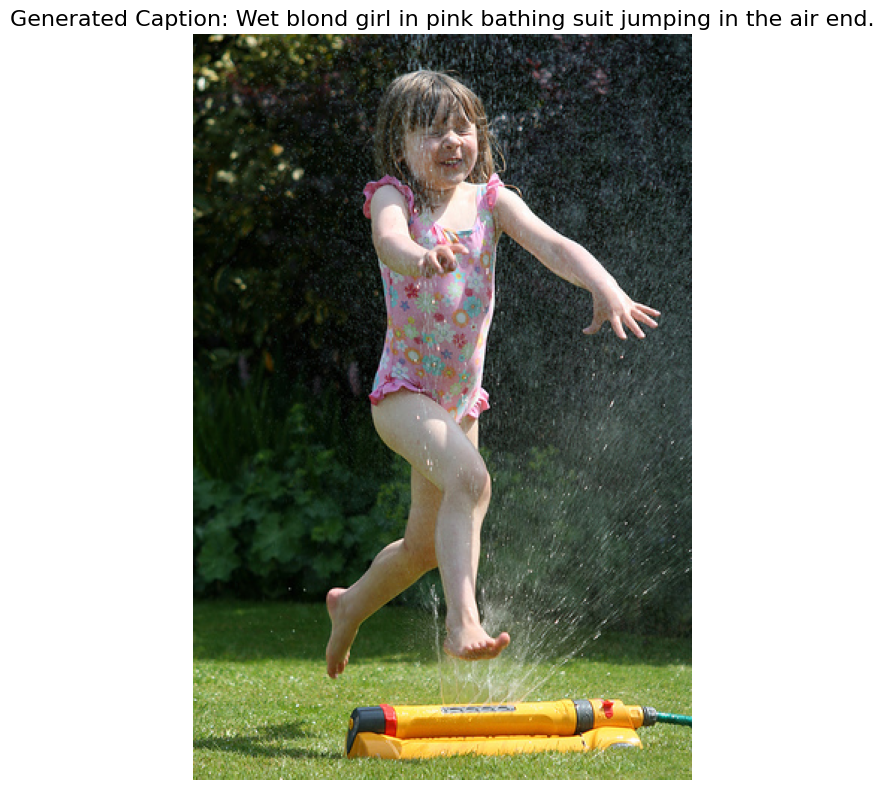

In [23]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pickle
from PIL import Image
import matplotlib.pyplot as plt
import os
import time

# Define paths
MODEL_PATH = "model/best_caption_generator.keras"
TOKENIZER_PATH = "data/tokenizer.pkl"

# Create test images directory in the current working directory
TEST_IMAGES_DIR = './test_images/'
os.makedirs(TEST_IMAGES_DIR, exist_ok=True)

print(f"Test images directory created at: {os.path.abspath(TEST_IMAGES_DIR)}")

# Load tokenizer and set parameters
print("Loading tokenizer...")
with open(TOKENIZER_PATH, "rb") as f:
    tokenizer = pickle.load(f)

# Check for special tokens and add them if they don't exist
special_tokens = ['<start>', '<end>', '<pad>']
for token in special_tokens:
    if token not in tokenizer.word_index:
        # Add missing tokens to the tokenizer
        next_index = len(tokenizer.word_index) + 1
        tokenizer.word_index[token] = next_index
        tokenizer.index_word[next_index] = token
        print(f"Added missing token '{token}' to tokenizer")

max_length = 40  # Same as in fixed training code

# Load the trained model
print("Loading model...")
try:
    model = load_model(MODEL_PATH)
    print("Model loaded successfully!")
except Exception as e:
    print(f"Error loading model: {e}")
    print("Make sure you've completed training and the model file exists.")

# Load CNN Model for Feature Extraction (InceptionV3)
print("Loading feature extraction model...")
base_model = InceptionV3(weights="imagenet", include_top=False, pooling='avg')

def preprocess_image(img_path):
    """Preprocess image for feature extraction"""
    try:
        # Open and preprocess image
        img = Image.open(img_path)
        img = img.resize((299, 299))  # InceptionV3 input size
        img = np.array(img)
        
        # Handle grayscale images
        if len(img.shape) == 2:
            img = np.stack((img,)*3, axis=-1)
        elif img.shape[2] == 1:
            img = np.concatenate([img, img, img], axis=2)
        elif img.shape[2] == 4:  # Handle RGBA
            img = img[:,:,:3]
            
        return img
    except Exception as e:
        print(f"Error preprocessing image: {e}")
        return None

def extract_features(img_path):
    """Extract features from image using InceptionV3"""
    try:
        img = preprocess_image(img_path)
        if img is None:
            return None
            
        # Reshape and preprocess for InceptionV3
        img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
        img = tf.keras.applications.inception_v3.preprocess_input(img)
        
        # Extract features
        features = base_model.predict(img, verbose=0)
        return features
    except Exception as e:
        print(f"Error extracting features: {e}")
        return None

def beam_search_predictions(image_features, beam_index=3):
    """Generate caption using beam search"""
    # Make sure we're using a valid start token
    if '<start>' in tokenizer.word_index:
        start = [tokenizer.word_index['<start>']]
    else:
        # Fallback: use the first token in the vocabulary as start token
        start = [1]
        print("Warning: <start> token not found, using fallback")
    
    # Initialize with start token
    start_word = [[start, 0.0]]
    
    while len(start_word[0][0]) < max_length:
        temp = []
        for s in start_word:
            par_caps = pad_sequences([s[0]], maxlen=max_length, padding='post')
            
            # Get model predictions for all time steps
            preds = model.predict([image_features, par_caps], verbose=0)
            
            # Get prediction for next word (current sequence length position)
            word_preds = preds[0, len(s[0])-1, :]
            
            # Get top k predictions
            word_idx = np.argsort(word_preds)[-beam_index:]
            
            # Create new sequences and calculate their probabilities
            for idx in word_idx:
                new_seq = s[0].copy()
                new_seq.append(idx)
                new_prob = s[1] + np.log(word_preds[idx])
                temp.append([new_seq, new_prob])
                
        # Sort all candidates by probability and select top beam_index
        start_word = sorted(temp, key=lambda x: x[1], reverse=True)[:beam_index]
        
        # If top candidate ends with '<end>', we're done
        end_token = tokenizer.word_index.get('<end>', 1)
        if start_word[0][0][-1] == end_token:
            break
    
    # Convert indices to words
    candidate = start_word[0][0]
    caption = []
    for idx in candidate:
        if idx < len(tokenizer.index_word):
            word = tokenizer.index_word.get(idx, '')
            if word not in ['<start>', '<end>', '<pad>']:
                caption.append(word)
            if word == '<end>':
                break
        else:
            # Handle out-of-vocabulary indices safely
            caption.append('')
    
    return ' '.join(caption)

def generate_caption(img_path, use_beam_search=True):
    """Generate caption for an image"""
    # Extract image features
    features = extract_features(img_path)
    if features is None:
        return "Error processing image"
    
    if use_beam_search:
        caption = beam_search_predictions(features)
    else:
        # Set up start token safely
        if '<start>' in tokenizer.word_index:
            input_text = [tokenizer.word_index['<start>']]
        else:
            input_text = [1]  # Fallback
            print("Warning: <start> token not found, using fallback")
            
        input_seq = pad_sequences([input_text], maxlen=max_length, padding='post')
        
        caption = ['<start>']
        
        # Generate caption word by word
        for i in range(max_length-1):
            # Predict next word
            preds = model.predict([features, input_seq], verbose=0)
            word_idx = np.argmax(preds[0, i, :])
            
            # Get word from index
            word = tokenizer.index_word.get(word_idx, '')
            caption.append(word)
            
            # Stop if end token is generated
            if word == '<end>':
                break
                
            # Update input sequence
            input_seq[0, i+1] = word_idx
        
        # Remove special tokens and join caption words
        caption = [word for word in caption if word not in ['<start>', '<end>', '<pad>']]
        caption = ' '.join(caption)
    
    # Post-process caption
    caption = caption.capitalize()
    if caption and not caption.endswith(('.', '!', '?')):
        caption += '.'
        
    return caption

# Function to display image with caption
def display_caption(img_path, caption):
    """Display image with generated caption"""
    plt.figure(figsize=(10, 8))
    img = Image.open(img_path)
    plt.imshow(np.array(img))
    plt.axis('off')
    plt.title(f"Generated Caption: {caption}", fontsize=16)
    plt.tight_layout()
    plt.show()

# Test the model with sample images
def test_model_on_images(image_dir=TEST_IMAGES_DIR, num_samples=5, use_beam_search=True):
    """Test model on a set of images"""
    image_files = [f for f in os.listdir(image_dir) 
                   if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    if not image_files:
        print(f"No images found in {image_dir}")
        print("Please upload some test images first!")
        return
    
    # Limit to requested number of samples
    samples = image_files[:min(num_samples, len(image_files))]
    
    print(f"Generating captions for {len(samples)} images with {'beam search' if use_beam_search else 'greedy search'}...")
    
    for img_file in samples:
        img_path = os.path.join(image_dir, img_file)
        start_time = time.time()
        try:
            caption = generate_caption(img_path, use_beam_search=use_beam_search)
            end_time = time.time()
            
            print(f"Image: {img_file}")
            print(f"Caption: {caption}")
            print(f"Generation time: {end_time - start_time:.2f} seconds")
            print("-" * 50)
            
            # Display image with caption
            display_caption(img_path, caption)
        except Exception as e:
            print(f"Error generating caption for {img_file}: {e}")
            print("-" * 50)

# Check if there are already images in the test directory
if not os.listdir(TEST_IMAGES_DIR):
    print("\nNo test images found. Please upload some images first!")
    print(f"Upload images to: {os.path.abspath(TEST_IMAGES_DIR)}")
    
    # For Kaggle environment - instructions to upload test images
    print("\nTo test with your own images in Kaggle:")
    print("1. Run the following code to see available sample images in the dataset (if any):")
    print("   import os; print(os.listdir('../input/deeplearning/Images/Images/')[:5])")
    print("2. Copy some sample images to your test directory with:")
    print("   from shutil import copy")
    print("   copy('../input/deeplearning/Images/Images/1000268201_693b08cb0e.jpg', './test_images/')")
    print("3. Or upload your own images using Kaggle's file upload feature")
    print("4. Run this cell again after adding images")
else:
    # Example usage - test on all images in the directory
    print("Testing caption generator...")
    # Try both beam search and greedy search
    print("\nUsing beam search:")
    test_model_on_images(use_beam_search=True)
    print("\nUsing greedy search:")
    test_model_on_images(use_beam_search=False)

# Function to copy sample images from the dataset to test directory
def copy_sample_images(num_samples=3):
    """Copy sample images from the dataset to test directory"""
    import shutil
    
    source_dir = '../input/deeplearning/Images/Images/'
    if not os.path.exists(source_dir):
        print(f"Source directory {source_dir} not found!")
        return False
        
    try:
        image_files = [f for f in os.listdir(source_dir) 
                      if f.lower().endswith(('.png', '.jpg', '.jpeg'))][:num_samples]
        
        if not image_files:
            print("No images found in source directory!")
            return False
            
        for img_file in image_files:
            src_path = os.path.join(source_dir, img_file)
            dst_path = os.path.join(TEST_IMAGES_DIR, img_file)
            shutil.copy(src_path, dst_path)
            print(f"Copied {img_file} to test directory")
        
        return True
    except Exception as e:
        print(f"Error copying sample images: {e}")
        return False

# Uncomment to automatically copy sample images from the dataset
# if not os.listdir(TEST_IMAGES_DIR):
#     print("Attempting to copy sample images from dataset...")
#     if copy_sample_images(3):
#         print("Sample images copied successfully!")
#         test_model_on_images(use_beam_search=True)

In [21]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pickle
import os
from tqdm import tqdm
import matplotlib.pyplot as plt

# Try importing packages needed for evaluation metrics
try:
    from nltk.translate.bleu_score import sentence_bleu
    nltk_available = True
except ImportError:
    print("NLTK not found. To install, run: !pip install nltk && python -m nltk.downloader punkt")
    nltk_available = False

try:
    from rouge import Rouge
    rouge_available = True
except ImportError:
    print("Rouge package not found. To install, run: !pip install rouge")
    rouge_available = False

try:
    from sklearn.metrics import precision_score, recall_score, f1_score
    sklearn_available = True
except ImportError:
    print("Scikit-learn not found. To install, run: !pip install scikit-learn")
    sklearn_available = False

# Define paths - *******************i should match these pathe with above cells' dir paths***************
BASE_DIR = '../input/deeplearning/'
IMAGES_DIR = os.path.join(BASE_DIR, 'Images/Images/')
CAPTIONS_PATH = os.path.join(BASE_DIR, 'captions.txt')
MODEL_PATH = "model/best_caption_generator.keras"
TOKENIZER_PATH = "data/tokenizer.pkl"
FEATURES_PATH = "data/image_features.pkl"

# Create directories for evaluation results
os.makedirs('evaluation', exist_ok=True)

def clean_caption(caption):
    """Clean caption text - same as in training code"""
    import string
    import re
    
    # Convert to lowercase
    caption = caption.lower()
    # Remove punctuation
    caption = caption.translate(str.maketrans('', '', string.punctuation))
    # Remove extra spaces
    caption = re.sub(' +', ' ', caption).strip()
    # Add start and end tokens
    caption = '<start> ' + caption + ' <end>'
    return caption

def evaluate_model(model, tokenizer, image_features, max_length=40, num_samples=100):
    print("Checking tokenizer vocabulary:")
    print("Special tokens in vocabulary:", 
    '<start>' in tokenizer.word_index,
    '<end>' in tokenizer.word_index, 
    '<pad>' in tokenizer.word_index)
    print("First 10 tokens:", list(tokenizer.word_index.items())[:10])
    
    """
    Evaluate the image captioning model using various metrics
    
    Parameters:
    model - trained captioning model
    tokenizer - text tokenizer used during training
    image_features - dictionary of image features
    max_length - maximum caption length
    num_samples - number of samples to evaluate
    """
    print(f"Evaluating model on {num_samples} samples...")
    
    # First load the captions data
    with open(CAPTIONS_PATH, "r") as f:
        captions_data = f.readlines()
    
    # Process captions - similar to training code
    cleaned_captions = []
    image_names = []
    
    for line in captions_data:
        line = line.strip()
        if line:  # Skip empty lines
            parts = line.split(',', 1)  # Split only at the first comma
            if len(parts) >= 2:
                image_name = parts[0].strip()
                caption = parts[1].strip()
                
                # Clean caption
                caption = clean_caption(caption)
                
                image_names.append(image_name)
                cleaned_captions.append(caption)
    
    # Prepare data for evaluation
    actual_captions = []
    predicted_captions = []
    image_paths = []
    
    # Get a subset of images that have features extracted
    valid_indices = []
    for i, img_name in enumerate(image_names):
        if img_name in image_features and len(valid_indices) < num_samples:
            valid_indices.append(i)
    
    if len(valid_indices) == 0:
        print("No valid images found with extracted features!")
        return
    
    # Select random samples from valid indices
    sample_indices = np.random.choice(valid_indices, min(num_samples, len(valid_indices)), replace=False)
    
    # Generate captions using beam search
    def beam_search_predictions(image_feature, beam_index=3):
        """Generate caption using beam search"""
        # Check what tokens actually exist in the tokenizer
        if '<start>' in tokenizer.word_index:
            start_token = '<start>'
            start = [tokenizer.word_index['<start>']]
        elif 'start' in tokenizer.word_index:  # Try without brackets
            start_token = 'start'
            start = [tokenizer.word_index['start']]
        else:
            # Last resort - use the first word in vocabulary
            start_token = list(tokenizer.word_index.keys())[0]
            start = [tokenizer.word_index[start_token]]
        
        print(f"Using '{start_token}' as start token")
        
        # Initialize with start token
        start_word = [[start, 0.0]]
        
        while len(start_word[0][0]) < max_length:
            temp = []
            for s in start_word:
                par_caps = pad_sequences([s[0]], maxlen=max_length, padding='post')
                
                # Get model predictions for all time steps
                preds = model.predict([image_feature.reshape(1, -1), par_caps], verbose=0)
                
                # Get prediction for next word (current sequence length position)
                word_preds = preds[0, len(s[0])-1, :]
                
                # Get top k predictions
                word_idx = np.argsort(word_preds)[-beam_index:]
                
                # Create new sequences and calculate their probabilities
                for idx in word_idx:
                    new_seq = s[0].copy()
                    new_seq.append(idx)
                    new_prob = s[1] + np.log(word_preds[idx])
                    temp.append([new_seq, new_prob])
                    
            # Sort all candidates by probability and select top beam_index
            start_word = sorted(temp, key=lambda x: x[1], reverse=True)[:beam_index]
            
            # If top candidate ends with '<end>', we're done
            end_token = tokenizer.word_index.get('<end>', 1)
            if start_word[0][0][-1] == end_token:
                break
        
        # Convert indices to words
        candidate = start_word[0][0]
        caption = []
        for idx in candidate:
            if idx < len(tokenizer.index_word):
                word = tokenizer.index_word.get(idx, '')
                if word not in ['<start>', '<end>', '<pad>']:
                    caption.append(word)
                if word == '<end>':
                    break
            else:
                # Handle out-of-vocabulary indices safely
                caption.append('')
        
        return ' '.join(caption)
    
    # Generate captions for the selected samples
    print("Generating captions for evaluation...")
    for idx in tqdm(sample_indices):
        img_name = image_names[idx]
        
        # Get image features
        feature = image_features[img_name]
        
        # Get actual caption (remove start and end tokens)
        actual_caption = cleaned_captions[idx].replace('<start>', '').replace('<end>', '').strip()
        
        # Generate caption using beam search
        predicted_caption = beam_search_predictions(feature)
        
        # Store results
        actual_captions.append(actual_caption)
        predicted_captions.append(predicted_caption)
        image_paths.append(img_name)
    
    # Save the captions for later analysis
    with open('evaluation/actual_captions.pkl', 'wb') as f:
        pickle.dump(actual_captions, f)
    
    with open('evaluation/predicted_captions.pkl', 'wb') as f:
        pickle.dump(predicted_captions, f)
        
    with open('evaluation/evaluated_images.pkl', 'wb') as f:
        pickle.dump(image_paths, f)
    
    # Calculate metrics
    print("Calculating evaluation metrics...")
    calculate_metrics(actual_captions, predicted_captions, tokenizer)
    
    # Create visualization of results
    visualize_results(image_paths, actual_captions, predicted_captions)
    
    return actual_captions, predicted_captions

def calculate_metrics(actual_captions, predicted_captions, tokenizer):
    """Calculate various NLP evaluation metrics"""
    # Initialize metric lists
    bleu_scores = []
    rouge_1_scores = []
    rouge_2_scores = []
    rouge_l_scores = []
    
    # BLEU Score Calculation
    if nltk_available:
        for i in range(len(actual_captions)):
            if not actual_captions[i] or not predicted_captions[i]:
                continue
                
            bleu = sentence_bleu([actual_captions[i].split()], predicted_captions[i].split())
            bleu_scores.append(bleu)
    
    # ROUGE Score Calculation
    if rouge_available:
        rouge = Rouge()
        for i in range(len(actual_captions)):
            if not actual_captions[i] or not predicted_captions[i]:
                continue
                
            try:
                scores = rouge.get_scores(predicted_captions[i], actual_captions[i])
                rouge_1_scores.append(scores[0]['rouge-1']['f'])
                rouge_2_scores.append(scores[0]['rouge-2']['f'])
                rouge_l_scores.append(scores[0]['rouge-l']['f'])
            except Exception as e:
                print(f"Error calculating ROUGE for caption {i}: {e}")
    
    # Print Results
    print("\nEVALUATION RESULTS:")
    print("=" * 30)
    if nltk_available and bleu_scores:
        print(f"Average BLEU Score: {np.mean(bleu_scores):.4f}")
    else:
        print("BLEU Score: Not available")
    
    if rouge_available and rouge_1_scores:
        print(f"Average ROUGE-1 Score: {np.mean(rouge_1_scores):.4f}")
        print(f"Average ROUGE-2 Score: {np.mean(rouge_2_scores):.4f}")
        print(f"Average ROUGE-L Score: {np.mean(rouge_l_scores):.4f}")
    else:
        print("ROUGE Scores: Not available")
    
    # Save detailed results
    results = {
        'bleu': bleu_scores,
        'rouge_1': rouge_1_scores,
        'rouge_2': rouge_2_scores,
        'rouge_l': rouge_l_scores
    }
    
    with open('evaluation/metrics_details.pkl', 'wb') as f:
        pickle.dump(results, f)
    
    # Create a summary results dictionary
    summary = {
        'bleu': np.mean(bleu_scores) if bleu_scores else 0,
        'rouge_1': np.mean(rouge_1_scores) if rouge_1_scores else 0,
        'rouge_2': np.mean(rouge_2_scores) if rouge_2_scores else 0,
        'rouge_l': np.mean(rouge_l_scores) if rouge_l_scores else 0
    }
    
    with open('evaluation/metrics_summary.pkl', 'wb') as f:
        pickle.dump(summary, f)
    
    # Create visualization of metrics
    if bleu_scores or rouge_1_scores:
        plot_metrics(results)

def visualize_results(image_paths, actual_captions, predicted_captions, num_samples=5):
    """Visualize a few sample results with images and captions"""
    from PIL import Image
    
    # Get random indices for samples to display
    sample_indices = np.random.choice(range(len(image_paths)), min(num_samples, len(image_paths)), replace=False)
    
    plt.figure(figsize=(20, 4*len(sample_indices)))
    
    for i, idx in enumerate(sample_indices):
        try:
            # Get image
            img_path = os.path.join(IMAGES_DIR, image_paths[idx])
            img = Image.open(img_path)
            
            # Display image and captions
            plt.subplot(len(sample_indices), 1, i+1)
            plt.imshow(np.array(img))
            plt.title(f"Actual: {actual_captions[idx]}\nPredicted: {predicted_captions[idx]}", fontsize=12)
            plt.axis('off')
        except Exception as e:
            print(f"Error displaying image {image_paths[idx]}: {e}")
    
    plt.tight_layout()
    plt.savefig('evaluation/sample_results.png')
    plt.close()

def plot_metrics(results):
    """Create visualizations of evaluation metrics"""
    # Create subplots based on available metrics
    num_metrics = sum(1 for scores in results.values() if scores)
    if num_metrics == 0:
        return
        
    fig, axes = plt.subplots(1, num_metrics, figsize=(6*num_metrics, 5))
    if num_metrics == 1:
        axes = [axes]  # Make iterable for single plot
        
    plot_idx = 0
    
    # Plot histograms of available scores
    if results['bleu']:
        axes[plot_idx].hist(results['bleu'], bins=10, alpha=0.7)
        axes[plot_idx].set_title('BLEU Scores')
        plot_idx += 1
    
    if results['rouge_1']:
        axes[plot_idx].hist(results['rouge_1'], bins=10, alpha=0.7)
        axes[plot_idx].set_title('ROUGE-1 Scores')
        plot_idx += 1
    
    if results['rouge_l']:
        axes[plot_idx].hist(results['rouge_l'], bins=10, alpha=0.7)
        axes[plot_idx].set_title('ROUGE-L Scores')
        plot_idx += 1
    
    plt.tight_layout()
    plt.savefig('evaluation/metrics_distribution.png')
    plt.close()
    
    # Plot score comparisons if we have both BLEU and ROUGE-L
    if results['bleu'] and results['rouge_l']:
        plt.figure(figsize=(10, 8))
        plt.scatter(results['bleu'], results['rouge_l'], alpha=0.5)
        plt.xlabel('BLEU Score')
        plt.ylabel('ROUGE-L Score')
        plt.title('BLEU vs ROUGE-L Score Correlation')
        plt.savefig('evaluation/bleu_vs_rouge.png')
        plt.close()

def run_evaluation(num_samples=100):
    """Run evaluation pipeline loading all required components"""
    print("Starting evaluation pipeline...")
    
    # Load model
    try:
        print("Loading model...")
        model = tf.keras.models.load_model(MODEL_PATH)
    except Exception as e:
        print(f"Error loading model: {e}")
        return
    
    # Load tokenizer
    try:
        print("Loading tokenizer...")
        with open(TOKENIZER_PATH, "rb") as f:
            tokenizer = pickle.load(f)
    except Exception as e:
        print(f"Error loading tokenizer: {e}")
        return
    
    # Load image features
    try:
        print("Loading image features...")
        with open(FEATURES_PATH, "rb") as f:
            image_features = pickle.load(f)
    except Exception as e:
        print(f"Error loading image features: {e}")
        return
    
    # Run evaluation
    print(f"Evaluating model on {num_samples} samples...")
    evaluate_model(
        model=model,
        tokenizer=tokenizer,
        image_features=image_features,
        max_length=40,  # Same as in training
        num_samples=num_samples
    )
    
    print("Evaluation complete! Results saved in evaluation/ directory.")

# Run the evaluation if this file is executed directly
if __name__ == "__main__":
    # Install required packages if missing
    if not nltk_available:
        print("Installing NLTK...")
        import sys
        import subprocess
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "nltk"])
        import nltk
        nltk.download('punkt')
    
    if not rouge_available:
        print("Installing Rouge...")
        import sys
        import subprocess
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "rouge"])
    
    if not sklearn_available:
        print("Installing scikit-learn...")
        import sys
        import subprocess
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "scikit-learn"])
    
    # Run evaluation with 50 samples
    run_evaluation(num_samples=50)

Starting evaluation pipeline...
Loading model...
Loading tokenizer...
Loading image features...
Evaluating model on 50 samples...
Checking tokenizer vocabulary:
Special tokens in vocabulary: False False True
First 10 tokens: [('<unk>', 1), ('a', 2), ('end', 3), ('start', 4), ('in', 5), ('the', 6), ('on', 7), ('is', 8), ('and', 9), ('dog', 10)]
Evaluating model on 50 samples...
Generating captions for evaluation...


  0%|          | 0/50 [00:00<?, ?it/s]

Using 'start' as start token


  2%|▏         | 1/50 [00:10<08:22, 10.26s/it]

Using 'start' as start token


  4%|▍         | 2/50 [00:19<07:50,  9.79s/it]

Using 'start' as start token


  6%|▌         | 3/50 [00:29<07:43,  9.86s/it]

Using 'start' as start token


  8%|▊         | 4/50 [00:39<07:28,  9.75s/it]

Using 'start' as start token


 10%|█         | 5/50 [00:49<07:19,  9.76s/it]

Using 'start' as start token


 12%|█▏        | 6/50 [00:58<07:06,  9.69s/it]

Using 'start' as start token


 14%|█▍        | 7/50 [01:07<06:52,  9.59s/it]

Using 'start' as start token


 16%|█▌        | 8/50 [01:17<06:40,  9.54s/it]

Using 'start' as start token


 18%|█▊        | 9/50 [01:26<06:27,  9.46s/it]

Using 'start' as start token


 20%|██        | 10/50 [01:36<06:16,  9.42s/it]

Using 'start' as start token


 22%|██▏       | 11/50 [01:45<06:09,  9.48s/it]

Using 'start' as start token


 24%|██▍       | 12/50 [01:55<06:04,  9.60s/it]

Using 'start' as start token


 26%|██▌       | 13/50 [02:05<05:54,  9.58s/it]

Using 'start' as start token


 28%|██▊       | 14/50 [02:14<05:44,  9.57s/it]

Using 'start' as start token


 30%|███       | 15/50 [02:24<05:40,  9.72s/it]

Using 'start' as start token


 32%|███▏      | 16/50 [02:34<05:32,  9.77s/it]

Using 'start' as start token


 34%|███▍      | 17/50 [02:44<05:24,  9.84s/it]

Using 'start' as start token


 36%|███▌      | 18/50 [02:54<05:16,  9.88s/it]

Using 'start' as start token


 38%|███▊      | 19/50 [03:04<05:05,  9.85s/it]

Using 'start' as start token


 40%|████      | 20/50 [03:13<04:53,  9.78s/it]

Using 'start' as start token


 42%|████▏     | 21/50 [03:23<04:43,  9.78s/it]

Using 'start' as start token


 44%|████▍     | 22/50 [03:33<04:32,  9.75s/it]

Using 'start' as start token


 46%|████▌     | 23/50 [03:42<04:22,  9.71s/it]

Using 'start' as start token


 48%|████▊     | 24/50 [03:53<04:17,  9.91s/it]

Using 'start' as start token


 50%|█████     | 25/50 [04:03<04:07,  9.90s/it]

Using 'start' as start token


 52%|█████▏    | 26/50 [04:12<03:55,  9.83s/it]

Using 'start' as start token


 54%|█████▍    | 27/50 [04:22<03:45,  9.79s/it]

Using 'start' as start token


 56%|█████▌    | 28/50 [04:32<03:32,  9.68s/it]

Using 'start' as start token


 58%|█████▊    | 29/50 [04:41<03:20,  9.56s/it]

Using 'start' as start token


 60%|██████    | 30/50 [04:50<03:09,  9.49s/it]

Using 'start' as start token


 62%|██████▏   | 31/50 [05:00<02:59,  9.47s/it]

Using 'start' as start token


 64%|██████▍   | 32/50 [05:09<02:49,  9.40s/it]

Using 'start' as start token


 66%|██████▌   | 33/50 [05:18<02:39,  9.39s/it]

Using 'start' as start token


 68%|██████▊   | 34/50 [05:28<02:31,  9.44s/it]

Using 'start' as start token


 70%|███████   | 35/50 [05:37<02:20,  9.38s/it]

Using 'start' as start token


 72%|███████▏  | 36/50 [05:46<02:11,  9.38s/it]

Using 'start' as start token


 74%|███████▍  | 37/50 [05:56<02:04,  9.61s/it]

Using 'start' as start token


 76%|███████▌  | 38/50 [06:06<01:55,  9.61s/it]

Using 'start' as start token


 78%|███████▊  | 39/50 [06:16<01:45,  9.57s/it]

Using 'start' as start token


 80%|████████  | 40/50 [06:25<01:35,  9.54s/it]

Using 'start' as start token


 82%|████████▏ | 41/50 [06:35<01:25,  9.54s/it]

Using 'start' as start token


 84%|████████▍ | 42/50 [06:44<01:15,  9.48s/it]

Using 'start' as start token


 86%|████████▌ | 43/50 [06:53<01:06,  9.46s/it]

Using 'start' as start token


 88%|████████▊ | 44/50 [07:03<00:57,  9.50s/it]

Using 'start' as start token


 90%|█████████ | 45/50 [07:13<00:48,  9.61s/it]

Using 'start' as start token


 92%|█████████▏| 46/50 [07:23<00:38,  9.64s/it]

Using 'start' as start token


 94%|█████████▍| 47/50 [07:32<00:29,  9.68s/it]

Using 'start' as start token


 96%|█████████▌| 48/50 [07:42<00:19,  9.64s/it]

Using 'start' as start token


 98%|█████████▊| 49/50 [07:51<00:09,  9.60s/it]

Using 'start' as start token


100%|██████████| 50/50 [08:01<00:00,  9.63s/it]


Calculating evaluation metrics...

EVALUATION RESULTS:
Average BLEU Score: 0.0858
Average ROUGE-1 Score: 0.3602
Average ROUGE-2 Score: 0.1890
Average ROUGE-L Score: 0.3495
Evaluation complete! Results saved in evaluation/ directory.
